# 한국 차량 번호판 탐지 데모

이 노트북은 `runs/license_plate_yolov8n/weights/best.pt` 모델을 이용해 단일 이미지에서 번호판 위치를 시각화합니다.

1. 아래 코드 셀의 `IMAGE_PATH`를 탐지할 이미지 경로로 바꾸세요.
2. 셀을 실행하면 번호판 박스가 그려진 이미지와 박스 좌표 및 신뢰도를 확인할 수 있습니다.

> Ultralytics `yolo` 패키지가 설치되어 있어야 하며, 이미 학습된 모델 파일이 존재해야 합니다.


In [17]:
from pathlib import Path
import os
import sys

# 가상환경 경로를 등록해 필요한 패키지를 사용할 수 있게 합니다.
VENV_DIR = Path('venv')
if not VENV_DIR.exists():
    raise FileNotFoundError(f'가상환경을 찾을 수 없습니다: {VENV_DIR}')

site_packages_candidates = sorted((VENV_DIR / 'lib').glob('python*/site-packages'))
if not site_packages_candidates:
    raise FileNotFoundError('site-packages 디렉터리를 찾을 수 없습니다. 가상환경 구성을 확인하세요.')
site_packages_path = site_packages_candidates[0].resolve()

if str(site_packages_path) not in sys.path:
    sys.path.insert(0, str(site_packages_path))

os.environ['VIRTUAL_ENV'] = str(VENV_DIR.resolve())
bin_path = (VENV_DIR / 'bin').resolve()
current_path = os.environ.get('PATH', '')
if current_path:
    path_parts = current_path.split(':')
    if str(bin_path) not in path_parts:
        os.environ['PATH'] = str(bin_path) + ':' + current_path
else:
    os.environ['PATH'] = str(bin_path)

print('가상환경 경로 설정 완료:', VENV_DIR)
print('현재 커널 파이썬:', sys.executable)
venv_python = bin_path / 'python'
if venv_python.exists() and sys.executable != str(venv_python):
    print('⚠️ 현재 커널이 가상환경 파이썬이 아닙니다. 필요한 경우 Jupyter 커널을 전환하세요.')


가상환경 경로 설정 완료: venv
현재 커널 파이썬: /usr/bin/python
⚠️ 현재 커널이 가상환경 파이썬이 아닙니다. 필요한 경우 Jupyter 커널을 전환하세요.


In [14]:
from pathlib import Path
from ultralytics import YOLO

MODEL_PATH = Path("runs/license_plate_yolov8n/weights/best.pt")
if not MODEL_PATH.exists():
    raise FileNotFoundError(f"모델 파일을 찾을 수 없습니다: {MODEL_PATH}")

model = YOLO(MODEL_PATH)
print(f"모델 로드 완료: {MODEL_PATH}")


모델 로드 완료: runs/license_plate_yolov8n/weights/best.pt


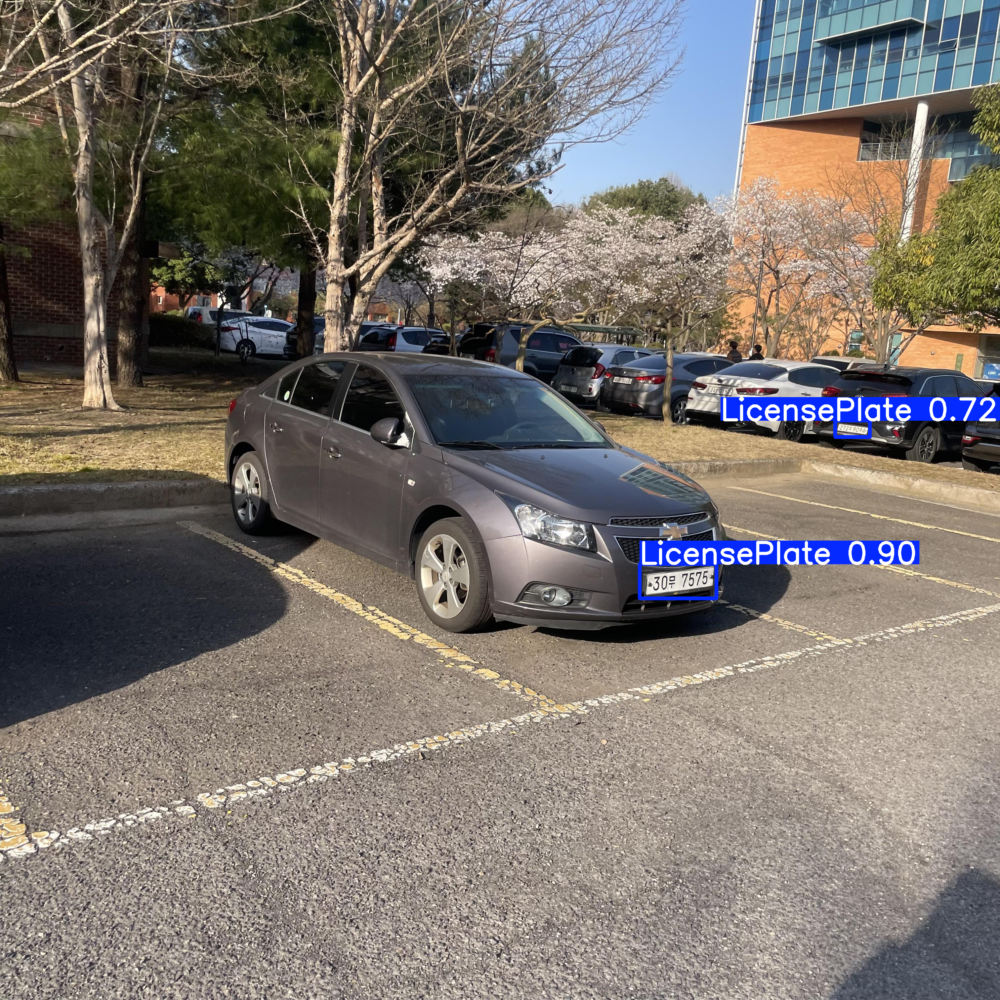

탐지 결과 (좌표는 픽셀 기준입니다.):
 - class=0 conf=0.903 bbox=(1934.1, 1705.1, 2166.8, 1809.5)
 - class=0 conf=0.718 bbox=(2525.5, 1271.0, 2630.1, 1321.4)


In [16]:
from pathlib import Path
from IPython.display import display
from PIL import Image

# TODO: 탐지할 이미지 경로를 입력하세요.
IMAGE_PATH = Path('../Korea Car License Plate/test/images/IMG_2662_jpg.rf.32986920b1a3dd23d146ee571d47913e.jpg')

if not IMAGE_PATH.exists():
    raise FileNotFoundError(f"이미지 파일을 찾을 수 없습니다: {IMAGE_PATH}")

results = model.predict(source=str(IMAGE_PATH), conf=0.5, verbose=False)
for result in results:
    annotated_bgr = result.plot()
    annotated_rgb = annotated_bgr[..., ::-1]
    display(Image.fromarray(annotated_rgb))

    boxes = result.boxes.xyxy.cpu().tolist()
    confs = result.boxes.conf.cpu().tolist()
    cls_ids = result.boxes.cls.cpu().tolist()

    if not boxes:
        print("탐지된 번호판이 없습니다.")
        continue

    print("탐지 결과 (좌표는 픽셀 기준입니다.):")
    for (x1, y1, x2, y2), conf, cls_id in zip(boxes, confs, cls_ids):
        print(
            f" - class={int(cls_id)} conf={conf:.3f} bbox=({x1:.1f}, {y1:.1f}, {x2:.1f}, {y2:.1f})"
        )
